Analysing Super Store Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

Reading Data

In [2]:
data = pd.read_csv('..\\data\\Sample_Superstore.csv', encoding='ISO-8859-1')

Data Columns

In [3]:
data.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')

Filling The Missing Values

In [4]:
# for c in data.columns:
#     if data[c].dtype != 'object':
#         data[c].fillna(data[c].mean(), inplace=True)
#     else:
#         data[c].fillna('', inplace=True)
data.fillna({c: data[c].mean() if data[c].dtype != 'object' else '' for c in data.columns}, inplace=True)

Dropping Duplicated Data

In [5]:
data.drop_duplicates(inplace=True)

Formating Dates

In [6]:
data['Ship Date'] = pd.to_datetime(data['Ship Date'], format='%m/%d/%Y')
data['Order Date'] = pd.to_datetime(data['Order Date'], format='%m/%d/%Y')

Downcasting All Strings To Lowercase

In [7]:
for c in data.select_dtypes(include='object').columns:
    data[c]=data[c].apply(lambda x:x.strip().lower())

In [8]:
data.isnull().sum()

Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64

Statistical Description

In [9]:
print(data.describe())
print(data.describe(include='object'))

            Row ID                     Order Date  \
count  9994.000000                           9994   
mean   4997.500000  2016-04-30 00:07:12.259355648   
min       1.000000            2014-01-03 00:00:00   
25%    2499.250000            2015-05-23 00:00:00   
50%    4997.500000            2016-06-26 00:00:00   
75%    7495.750000            2017-05-14 00:00:00   
max    9994.000000            2017-12-30 00:00:00   
std    2885.163629                            NaN   

                           Ship Date   Postal Code         Sales     Quantity  \
count                           9994   9994.000000   9994.000000  9994.000000   
mean   2016-05-03 23:06:58.571142912  55190.379428    229.858001     3.789574   
min              2014-01-07 00:00:00   1040.000000      0.444000     1.000000   
25%              2015-05-27 00:00:00  23223.000000     17.280000     2.000000   
50%              2016-06-29 00:00:00  56430.500000     54.490000     3.000000   
75%              2017-05-18 00:00:00

In [10]:
for c in data.select_dtypes(include='object').columns:
    print(data[c].value_counts())

Order ID
ca-2017-100111    14
ca-2017-157987    12
ca-2016-165330    11
us-2016-108504    11
us-2015-126977    10
                  ..
ca-2014-110422     1
ca-2016-125794     1
ca-2017-163566     1
us-2015-151435     1
ca-2016-130225     1
Name: count, Length: 5009, dtype: int64
Ship Mode
standard class    5968
second class      1945
first class       1538
same day           543
Name: count, dtype: int64
Customer ID
wb-21850    37
ma-17560    34
jl-15835    34
pp-18955    34
ck-12205    32
            ..
ao-10810     1
ld-16855     1
jr-15700     1
cj-11875     1
re-19405     1
Name: count, Length: 793, dtype: int64
Customer Name
william brown          37
matt abelman           34
john lee               34
paul prost             34
chloris kastensmidt    32
                       ..
anthony o'donnell       1
lela donovan            1
jocasta rupert          1
carl jackson            1
ricardo emerson         1
Name: count, Length: 793, dtype: int64
Segment
consumer       5191
corporate

In [11]:
data

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,ca-2016-152156,2016-11-08,2016-11-11,second class,cg-12520,claire gute,consumer,united states,henderson,...,42420,south,fur-bo-10001798,furniture,bookcases,bush somerset collection bookcase,261.9600,2,0.00,41.9136
1,2,ca-2016-152156,2016-11-08,2016-11-11,second class,cg-12520,claire gute,consumer,united states,henderson,...,42420,south,fur-ch-10000454,furniture,chairs,"hon deluxe fabric upholstered stacking chairs,...",731.9400,3,0.00,219.5820
2,3,ca-2016-138688,2016-06-12,2016-06-16,second class,dv-13045,darrin van huff,corporate,united states,los angeles,...,90036,west,off-la-10000240,office supplies,labels,self-adhesive address labels for typewriters b...,14.6200,2,0.00,6.8714
3,4,us-2015-108966,2015-10-11,2015-10-18,standard class,so-20335,sean o'donnell,consumer,united states,fort lauderdale,...,33311,south,fur-ta-10000577,furniture,tables,bretford cr4500 series slim rectangular table,957.5775,5,0.45,-383.0310
4,5,us-2015-108966,2015-10-11,2015-10-18,standard class,so-20335,sean o'donnell,consumer,united states,fort lauderdale,...,33311,south,off-st-10000760,office supplies,storage,eldon fold 'n roll cart system,22.3680,2,0.20,2.5164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9989,9990,ca-2014-110422,2014-01-21,2014-01-23,second class,tb-21400,tom boeckenhauer,consumer,united states,miami,...,33180,south,fur-fu-10001889,furniture,furnishings,ultra door pull handle,25.2480,3,0.20,4.1028
9990,9991,ca-2017-121258,2017-02-26,2017-03-03,standard class,db-13060,dave brooks,consumer,united states,costa mesa,...,92627,west,fur-fu-10000747,furniture,furnishings,tenex b1-re series chair mats for low pile car...,91.9600,2,0.00,15.6332
9991,9992,ca-2017-121258,2017-02-26,2017-03-03,standard class,db-13060,dave brooks,consumer,united states,costa mesa,...,92627,west,tec-ph-10003645,technology,phones,aastra 57i voip phone,258.5760,2,0.20,19.3932
9992,9993,ca-2017-121258,2017-02-26,2017-03-03,standard class,db-13060,dave brooks,consumer,united states,costa mesa,...,92627,west,off-pa-10004041,office supplies,paper,"it's hot message books with stickers, 2 3/4"" x 5""",29.6000,4,0.00,13.3200


Average Of Profits For  Each Category Kind

In [12]:
data.groupby('Category')['Profit'].mean()

Category
furniture           8.699327
office supplies    20.327050
technology         78.752002
Name: Profit, dtype: float64

Profit Margin = $\frac{Profit}{Sales}$ 

In [13]:
data['Profit Margin'] = data['Profit'] / data['Sales']
data

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Profit Margin
0,1,ca-2016-152156,2016-11-08,2016-11-11,second class,cg-12520,claire gute,consumer,united states,henderson,...,south,fur-bo-10001798,furniture,bookcases,bush somerset collection bookcase,261.9600,2,0.00,41.9136,0.1600
1,2,ca-2016-152156,2016-11-08,2016-11-11,second class,cg-12520,claire gute,consumer,united states,henderson,...,south,fur-ch-10000454,furniture,chairs,"hon deluxe fabric upholstered stacking chairs,...",731.9400,3,0.00,219.5820,0.3000
2,3,ca-2016-138688,2016-06-12,2016-06-16,second class,dv-13045,darrin van huff,corporate,united states,los angeles,...,west,off-la-10000240,office supplies,labels,self-adhesive address labels for typewriters b...,14.6200,2,0.00,6.8714,0.4700
3,4,us-2015-108966,2015-10-11,2015-10-18,standard class,so-20335,sean o'donnell,consumer,united states,fort lauderdale,...,south,fur-ta-10000577,furniture,tables,bretford cr4500 series slim rectangular table,957.5775,5,0.45,-383.0310,-0.4000
4,5,us-2015-108966,2015-10-11,2015-10-18,standard class,so-20335,sean o'donnell,consumer,united states,fort lauderdale,...,south,off-st-10000760,office supplies,storage,eldon fold 'n roll cart system,22.3680,2,0.20,2.5164,0.1125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9989,9990,ca-2014-110422,2014-01-21,2014-01-23,second class,tb-21400,tom boeckenhauer,consumer,united states,miami,...,south,fur-fu-10001889,furniture,furnishings,ultra door pull handle,25.2480,3,0.20,4.1028,0.1625
9990,9991,ca-2017-121258,2017-02-26,2017-03-03,standard class,db-13060,dave brooks,consumer,united states,costa mesa,...,west,fur-fu-10000747,furniture,furnishings,tenex b1-re series chair mats for low pile car...,91.9600,2,0.00,15.6332,0.1700
9991,9992,ca-2017-121258,2017-02-26,2017-03-03,standard class,db-13060,dave brooks,consumer,united states,costa mesa,...,west,tec-ph-10003645,technology,phones,aastra 57i voip phone,258.5760,2,0.20,19.3932,0.0750
9992,9993,ca-2017-121258,2017-02-26,2017-03-03,standard class,db-13060,dave brooks,consumer,united states,costa mesa,...,west,off-pa-10004041,office supplies,paper,"it's hot message books with stickers, 2 3/4"" x 5""",29.6000,4,0.00,13.3200,0.4500


Now i'm gonna go for Query's questions plot

-------------------------------------------------

What are the total sales and profits? Which has grown the most?

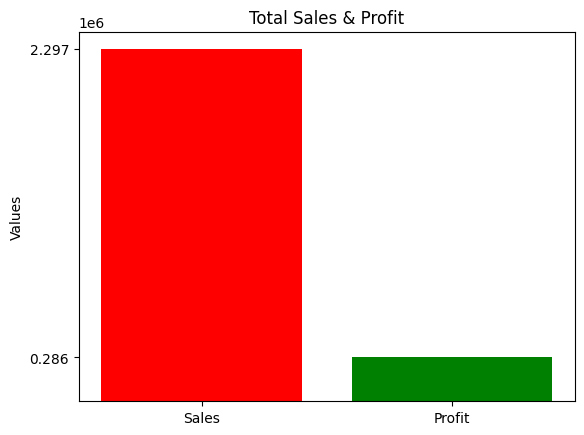

In [15]:
obj = ['Sales','Profit']
x_pos = np.arange(len(obj))
y_pos = data[obj].sum()
plt.bar(x_pos,y_pos,color = ['red','green'])
plt.title('Total Sales & Profit')
plt.yticks(y_pos)
plt.xticks(x_pos,obj)
plt.ylabel('Values')
plt.savefig('..\\Plots\\Total_Sales_&_Profit.jpg')

Have sales trends been growing?

In [16]:
df = data.groupby('Order Date')['Sales'].sum()
y = df.values
x = df.index
plt.figure(figsize=(500,200))
plt.plot(x,y,marker='o', linestyle='-')
plt.title('Trends')
plt.xlabel('Date')
plt.ylabel('Sales')
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=30))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%Y'))
plt.savefig('..\\Plots\\Trends.jpg')

What product category has the most sales/profits?

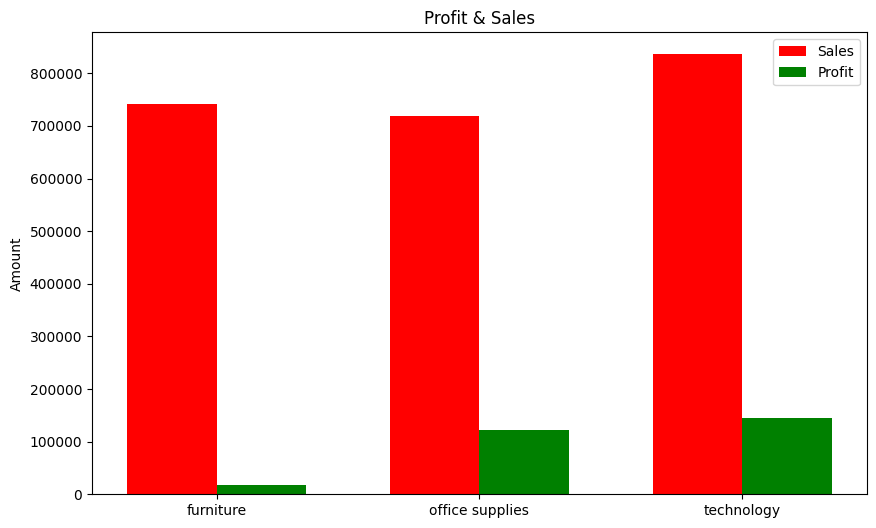

In [18]:
df2 = data.groupby('Category')[['Sales', 'Profit']].sum().reset_index()
x_label = df2['Category'].values
x_pos2 = np.arange(len(x_label))
y2 = df2['Sales'].values
y3 = df2['Profit'].values
bar_width = 0.34
plt.figure(figsize=(10,6))
plt.bar(x_pos2 - bar_width/2 ,y2,bar_width,color = 'r' ,label = 'Sales')
plt.bar(x_pos2 + bar_width/2 ,y3,bar_width,color = 'g' ,label = 'Profit')
plt.xticks(x_pos2,x_label)
plt.legend()
plt.ylabel('Amount')
plt.title('Profit & Sales')
plt.savefig('..\\Plots\\Profit_Sales.jpg')

Which state has the most profit?

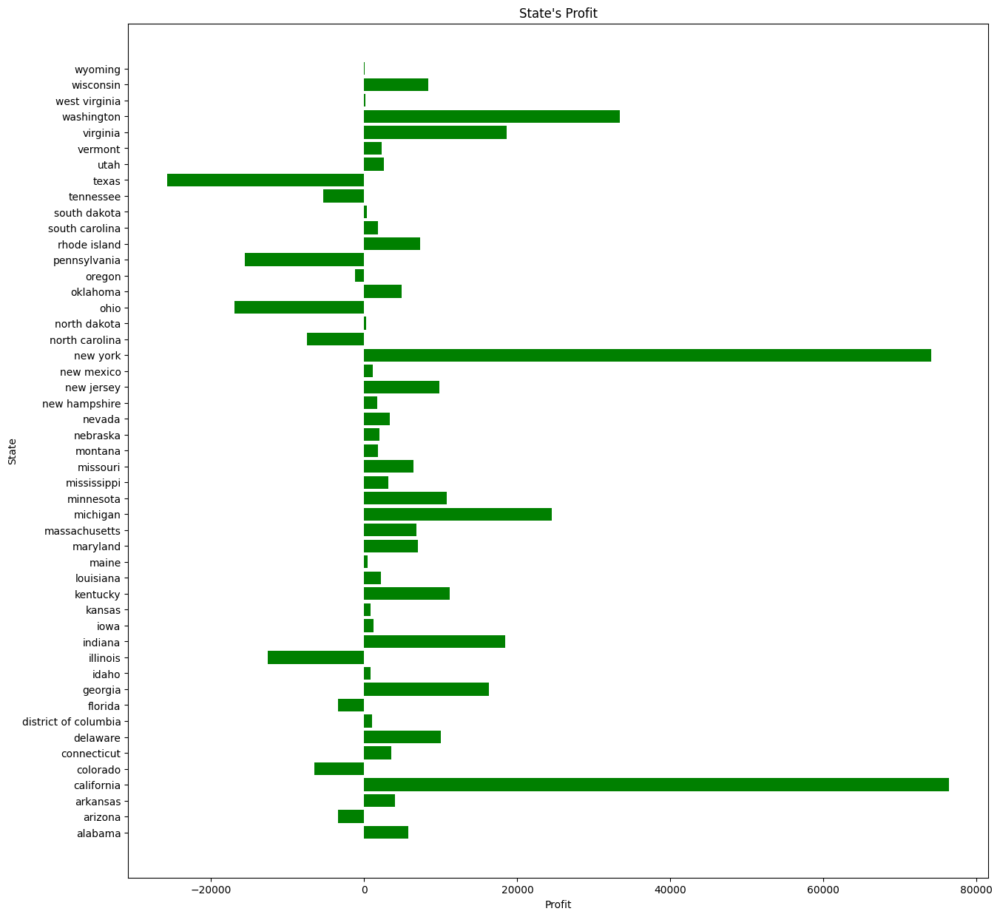

In [19]:
df3 = data.groupby('State')['Profit'].sum()
y_pos = np.arange(len(df3.index))
x_pos = df3.values
y_label = df3.index

plt.figure(figsize=(15,15))
plt.barh(y_pos,x_pos, color = 'g')
plt.yticks(y_pos,y_label)
plt.ylabel('State')
plt.xlabel('Profit')
plt.title("State's Profit")
plt.savefig("..\\Plots\\State's Profit.jpg")

Do we have high-sales, low-profit products?

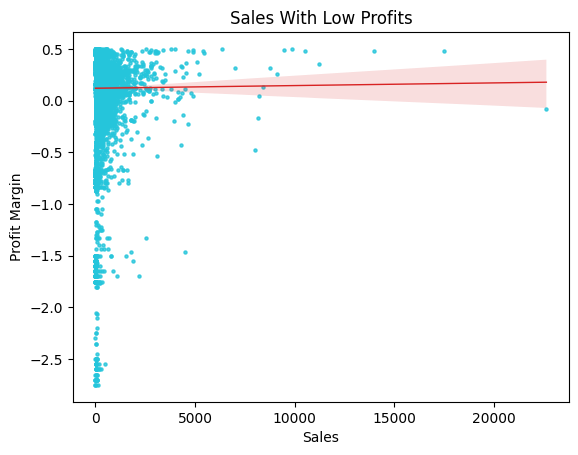

In [20]:
# sns.scatterplot(data=data,x='Sales',y='Profit Margin',color= '#25C5DB') <--- for showing another way to drawing
sns.regplot(data=data,x='Sales',y='Profit Margin',line_kws={'color' : '#D82222','linewidth': 1},scatter_kws={'color' : '#25C5DB','s' : 5})
plt.title('Sales With Low Profits')
plt.savefig('..\\Plots\\Sales_Low_Profit.jpg')

Shipping Delays by Category

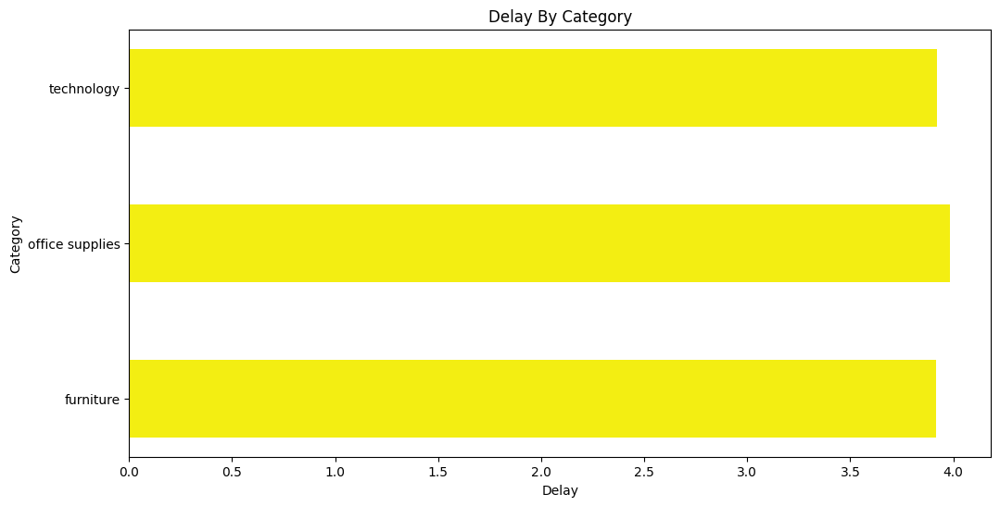

In [21]:
data['Delay'] = (data['Ship Date']-data['Order Date']).dt.total_seconds()/(24*60*60) # this '.dt.total_seconds/24*60*60' part is to get the number of delay column(e.g. 3 days 22:00:30.551626591) /60 is for minute then /60 is for hours then /24 for days
df4 = data.groupby('Category')['Delay'].mean()
y_pos = np.arange(len(df4.index))
y_label = df4.index
x_pos = df4.values
bar_width= 0.5

plt.figure(figsize=(12,6))
plt.barh(y_pos,x_pos,bar_width,color = '#F3EE12')
plt.yticks(y_pos,y_label)
plt.ylabel('Category')
plt.xlabel('Delay')
plt.title('Delay By Category')
plt.savefig("..\\Plots\\Delay_By_Category.jpg")